Analysis of effects of batch on distance metrics and evaluation measures.

In [40]:
import pickle
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr, pearsonr

from evaluation_util import plot, evaluate_on_dataset, perf_df
from utils import plt_legend

import warnings
warnings.filterwarnings('ignore')

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
dss_path = '/lustre/scratch/users/yuge.ji/metrics_revisions/'

In [4]:
performances = {}

Note that we can't do direct comparisons here with the previous results for schiebinger and tahoe because they required smaller n_min_cells due to fewer control cells, unlike for sciplex.

### schiebinger

In [54]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['day'] = [float(p[1:]) if 'D' in p else 0 for p in df.perturbation]

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


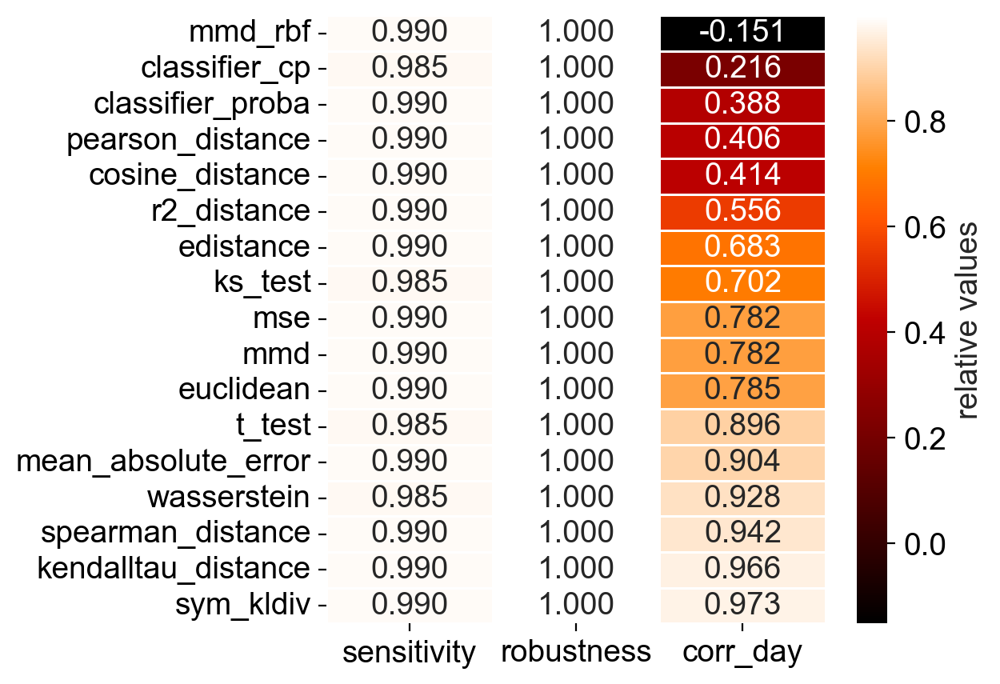

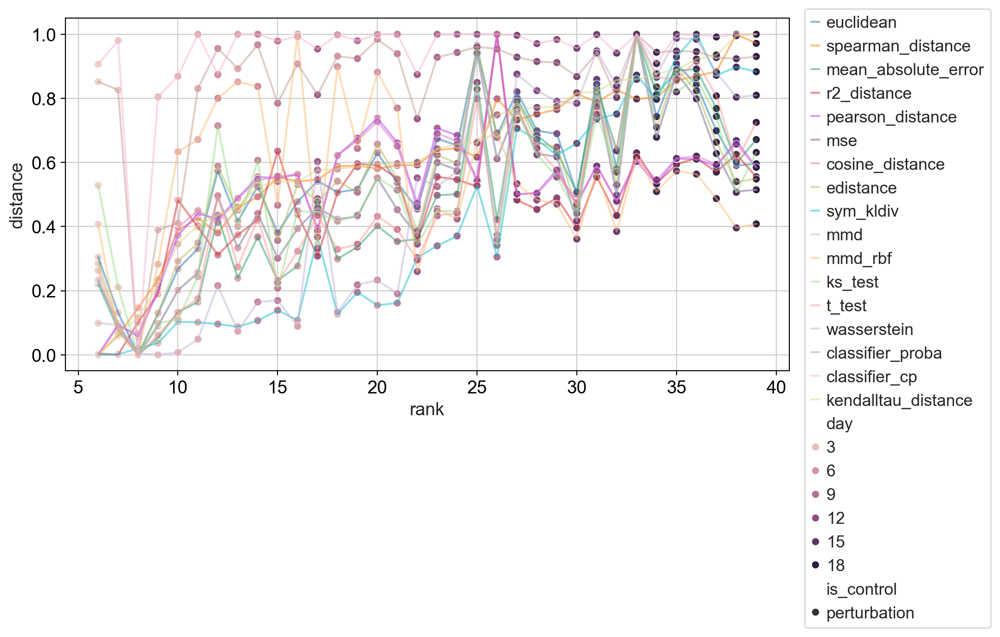

In [55]:
with open(dss_path + 'schiebinger_rep1_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['schiebinger_rep1'] = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


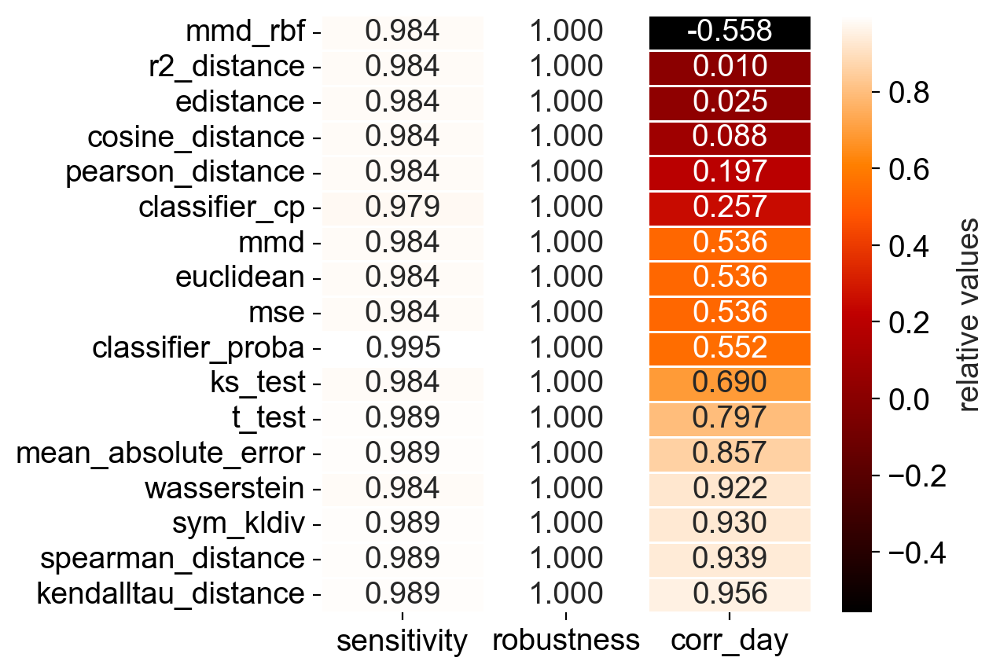

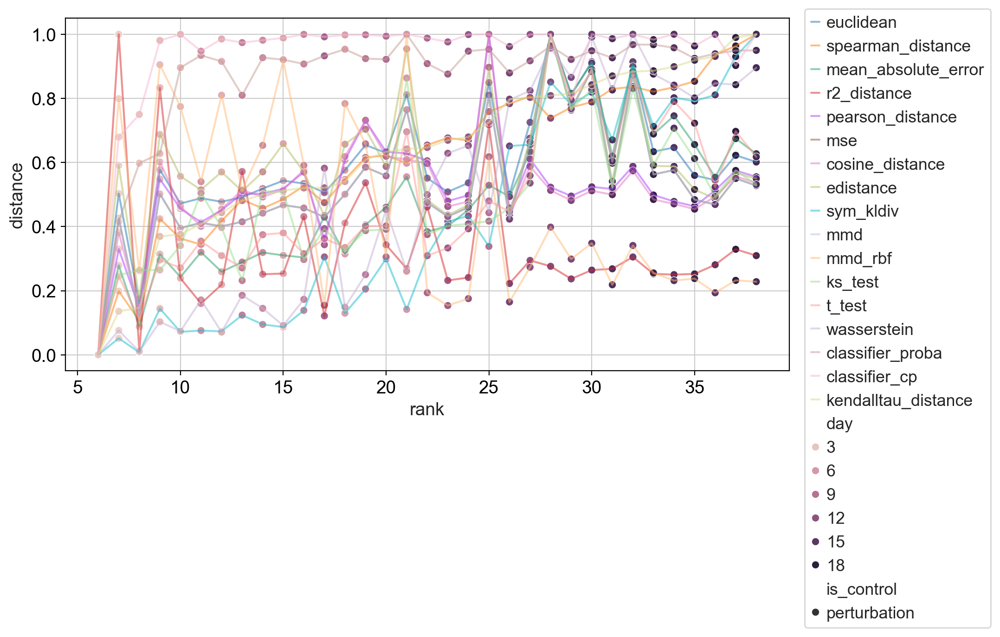

In [56]:
with open(dss_path + 'schiebinger_rep2_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['schiebinger_rep2'] = perf = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


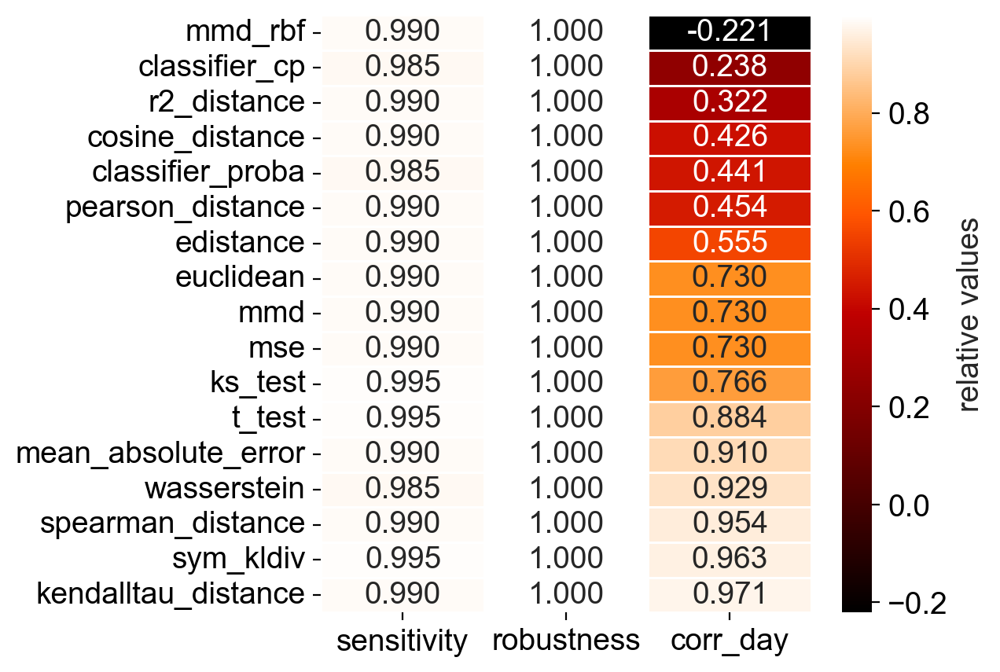

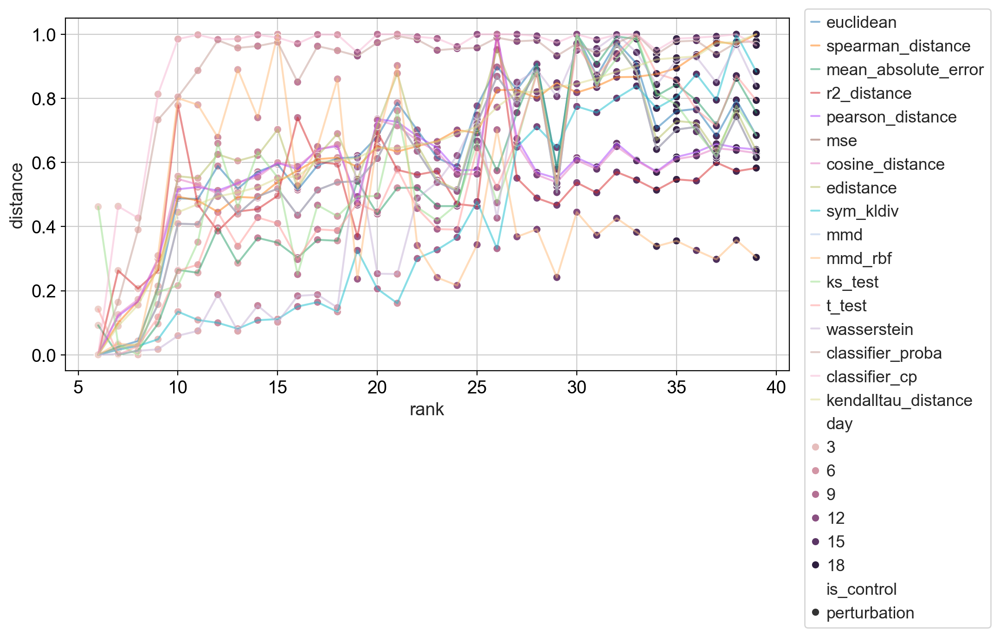

In [57]:
with open(dss_path + 'schiebinger_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['schiebinger_original'] = perf = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

### Tahoe

Since Tahoe did replicates by plate, only two of these had enough cells to run.

In [36]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


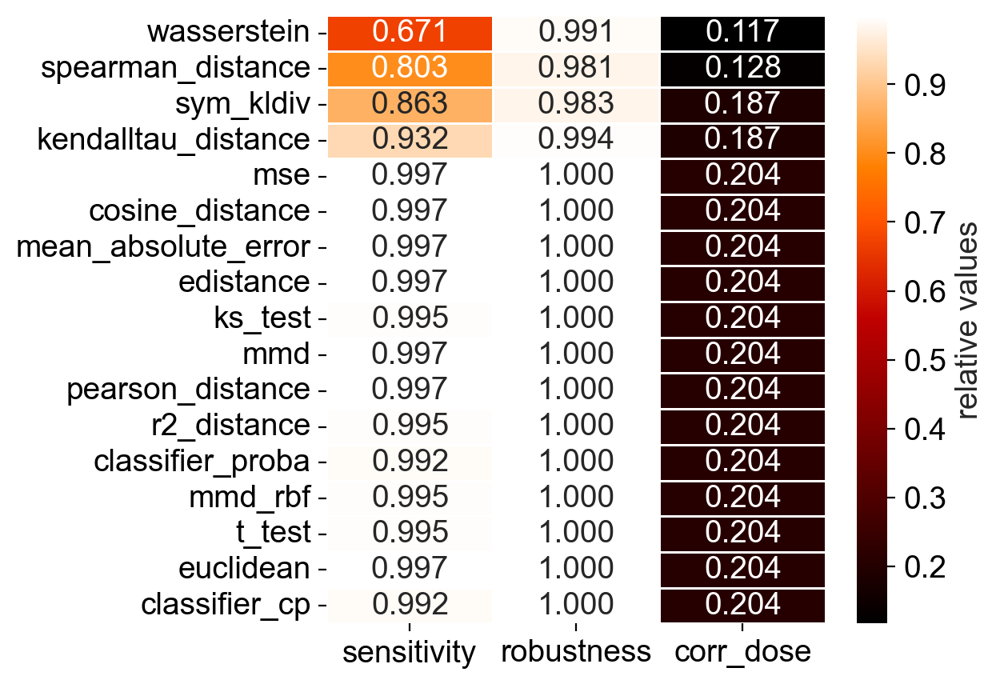

CPU times: user 1.05 s, sys: 300 ms, total: 1.35 s
Wall time: 993 ms


,sensitivity,robustness,corr_dose
wasserstein,0.671053,0.991170,0.116642
spearman_distance,0.802632,0.980956,0.128307
sym_kldiv,0.863158,0.982635,0.186628
kendalltau_distance,0.931579,0.994166,0.186628
mse,0.997368,0.999965,0.204124
cosine_distance,0.997368,0.999965,0.204124
mean_absolute_error,0.997368,0.999965,0.204124
edistance,0.997368,0.999965,0.204124
ks_test,0.994737,0.999948,0.204124
mmd,0.997368,0.999965,0.204124


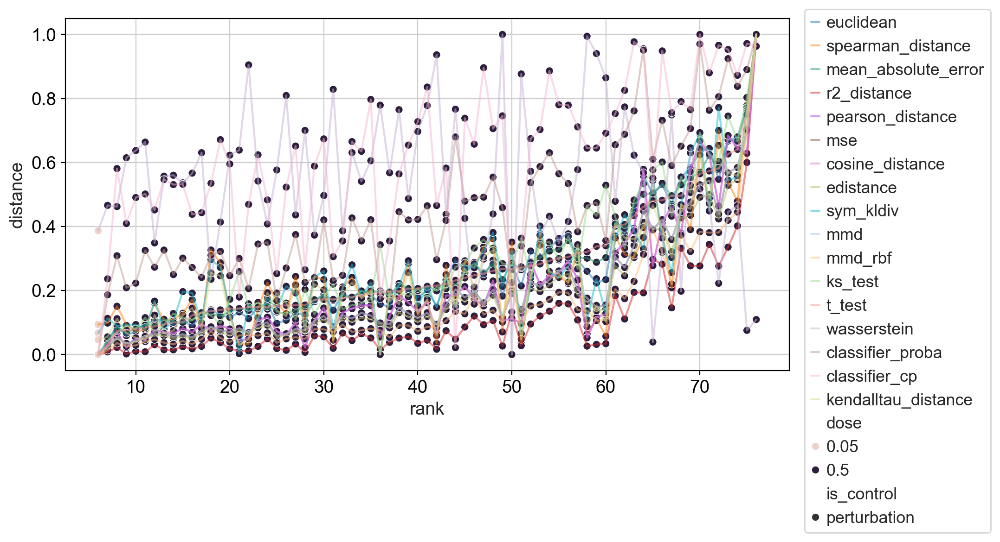

In [37]:
with open(f'{dss_path}/tahoe_rep2_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['tahoe_rep2'] = evaluate_on_dataset(results, annotate, 'dose', 't_test')

with open(f'{dss_path}/tahoe_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['tahoe_original'] = evaluate_on_dataset(results, annotate, 'dose', 't_test')

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


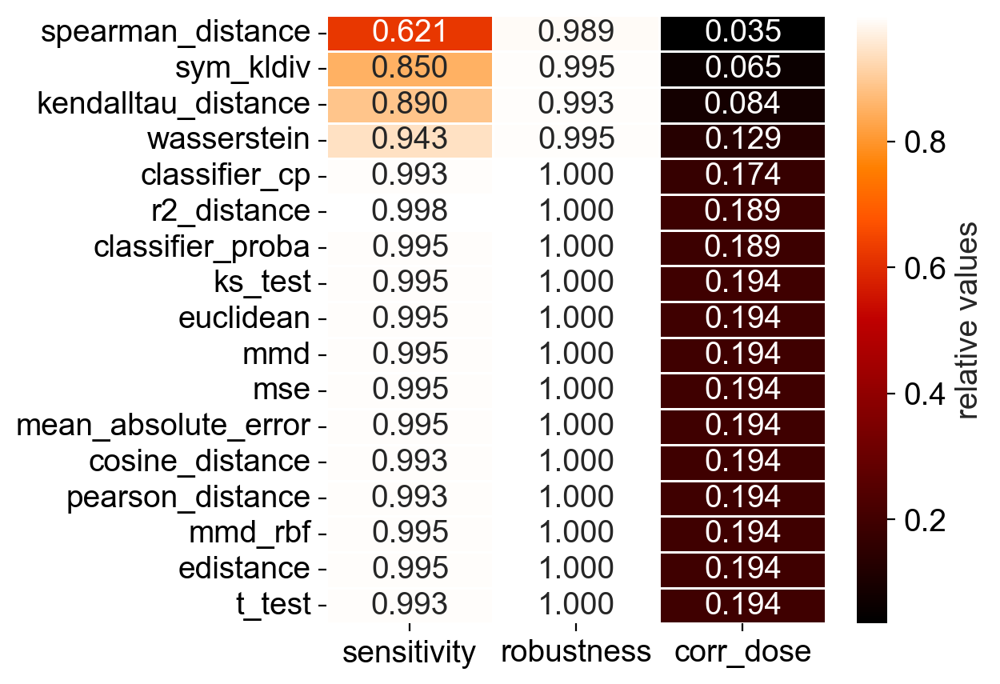

CPU times: user 957 ms, sys: 303 ms, total: 1.26 s
Wall time: 800 ms


,sensitivity,robustness,corr_dose
spearman_distance,0.621429,0.989484,0.034758
sym_kldiv,0.850000,0.994785,0.064550
kendalltau_distance,0.890476,0.992744,0.084411
wasserstein,0.942857,0.995295,0.129099
classifier_cp,0.992857,0.999957,0.173788
r2_distance,0.997619,0.999972,0.188684
classifier_proba,0.995238,0.999957,0.188684
ks_test,0.995238,0.999957,0.193649
euclidean,0.995238,0.999957,0.193649
mmd,0.995238,0.999957,0.193649


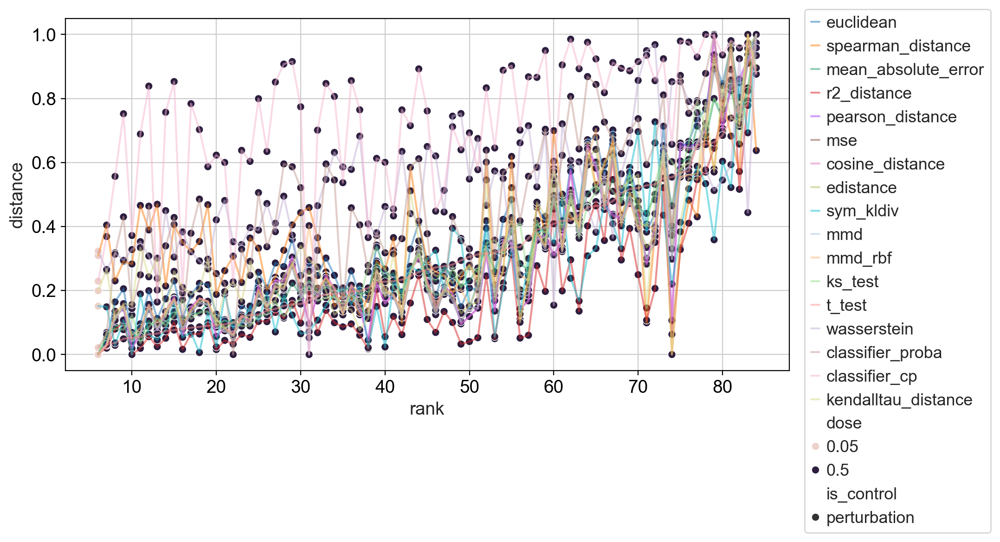

In [38]:
%%time
with open(f'{dss_path}/tahoeHT29_rep2_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['tahoeHT29_rep2'] = evaluate_on_dataset(results, annotate, 'dose', 't_test')

### sciplex

Only MCF7 had enough cells per condition after separating into two replicates.

In [74]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


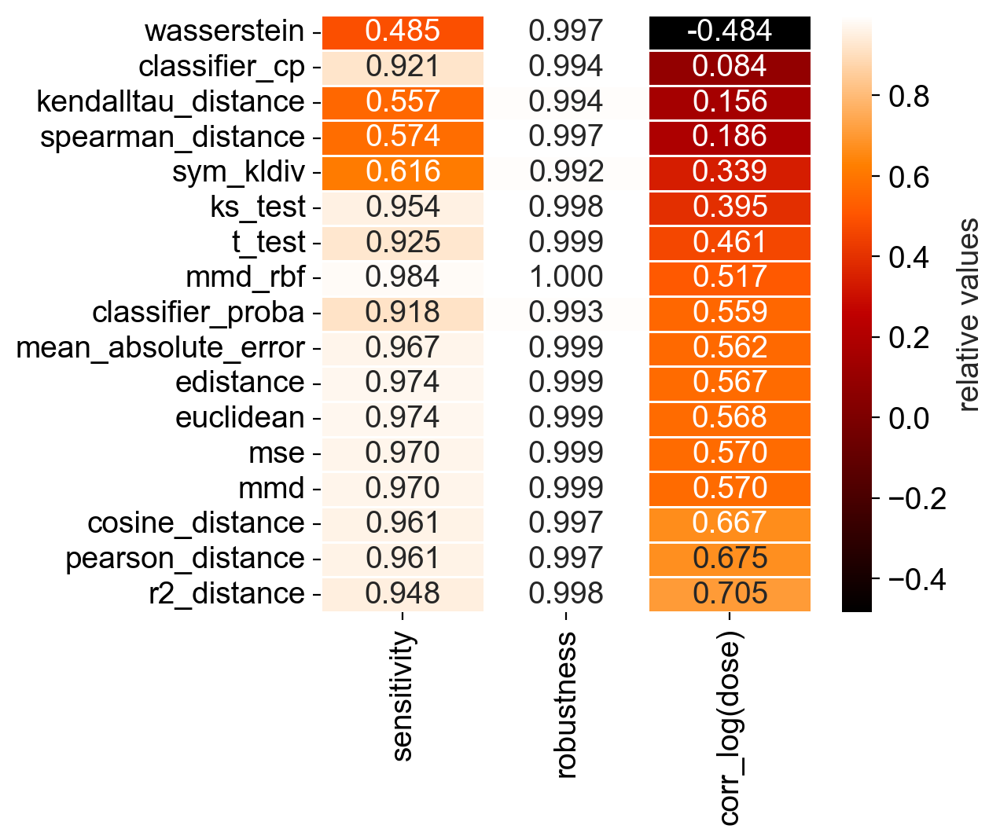

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


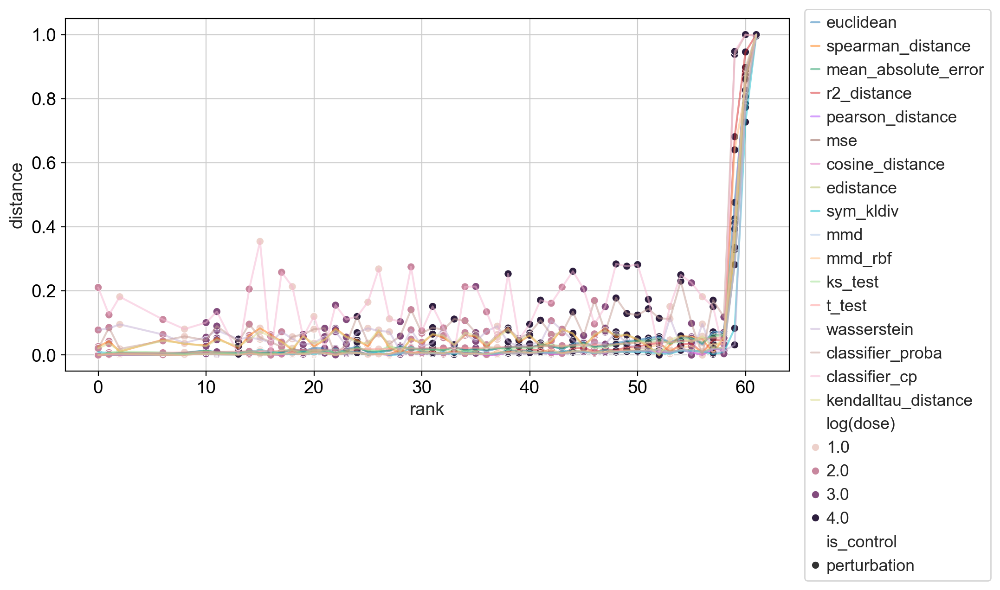

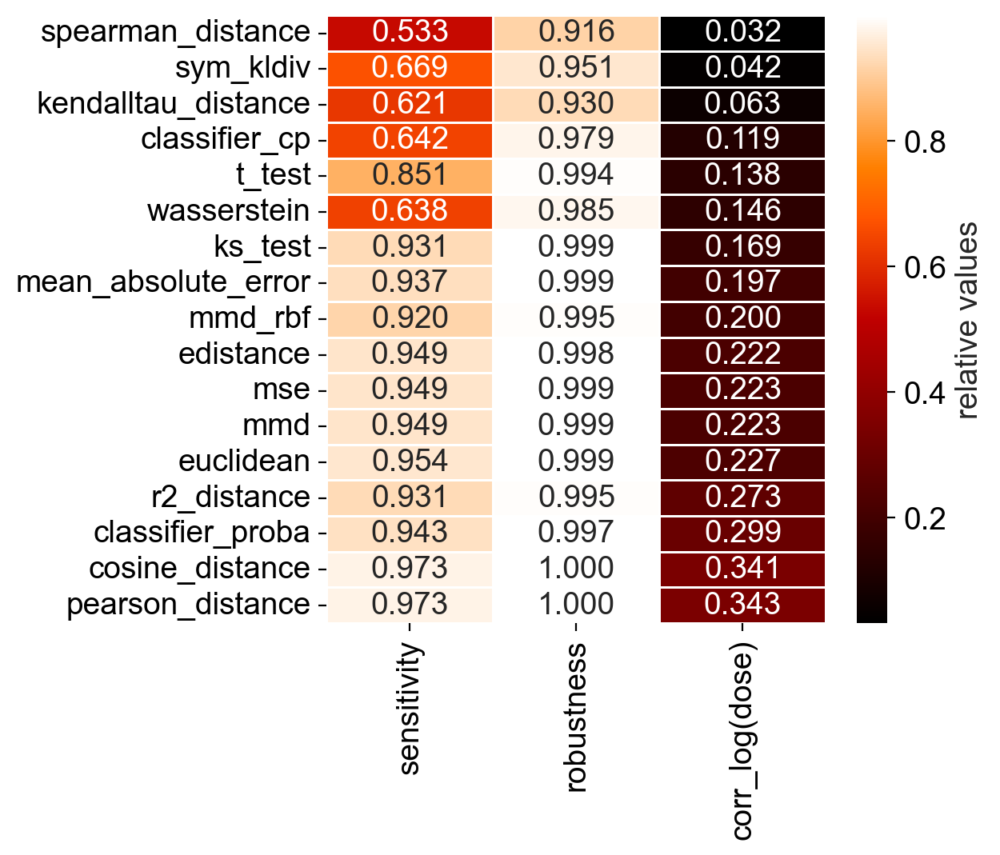

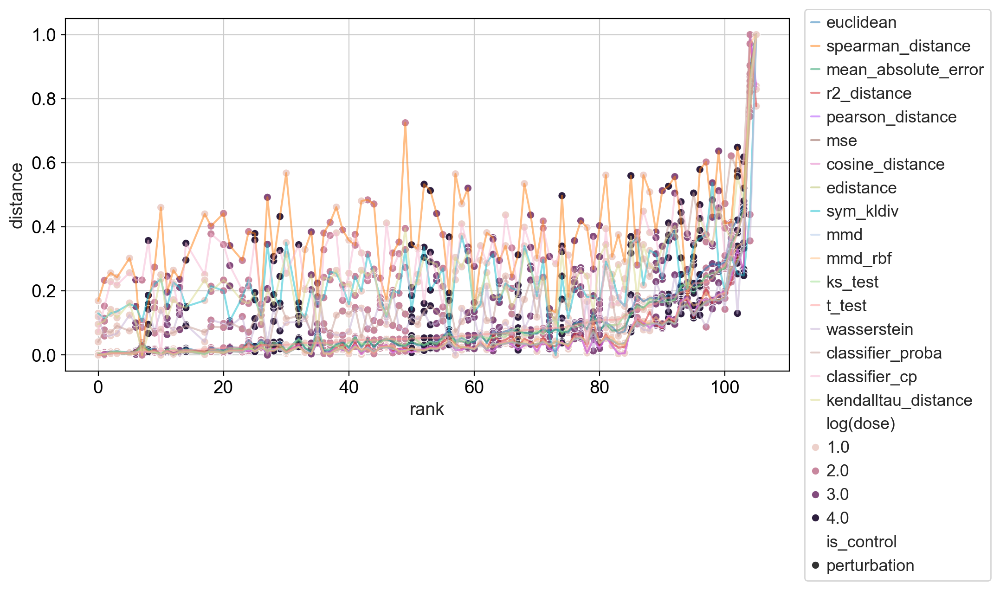

In [6]:
with open(f'{dss_path}/spMCF7_rep1_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['sciplex_rep1'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test');

with open(f'{dss_path}/spMCF7_rep2_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['sciplex_rep2'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test');

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])


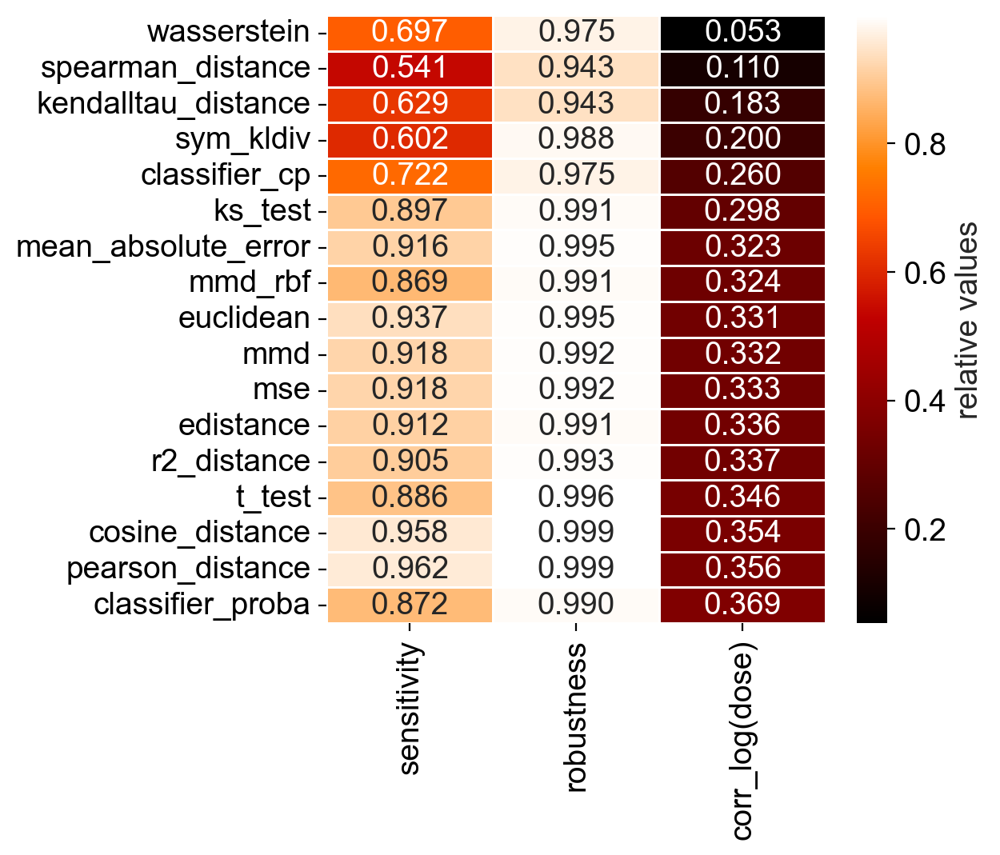

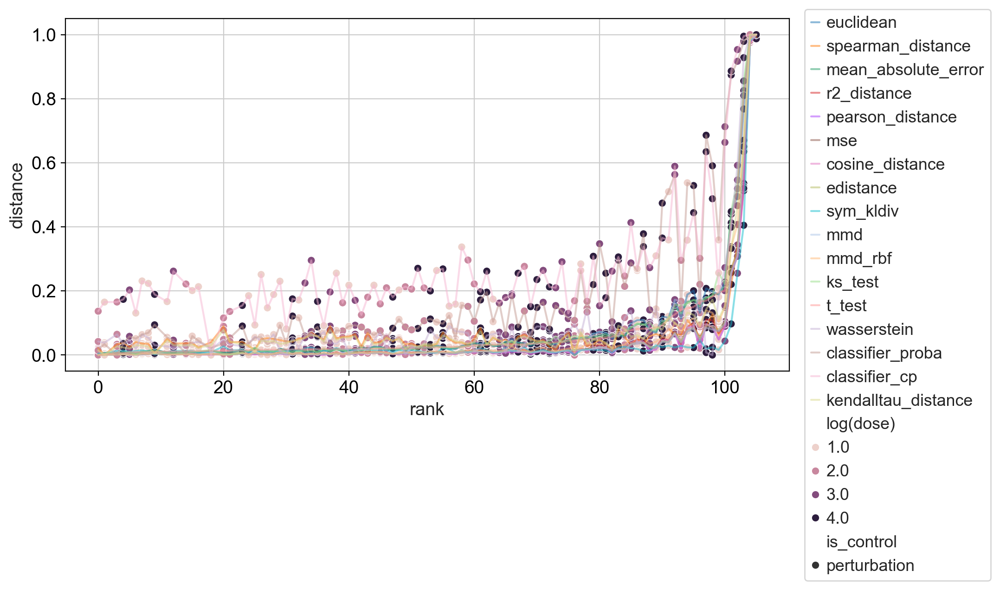

In [7]:
with open(f'{dss_path}/spMCF7_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())
performances['sciplex_original'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test');

## comparisons

### schiebinger

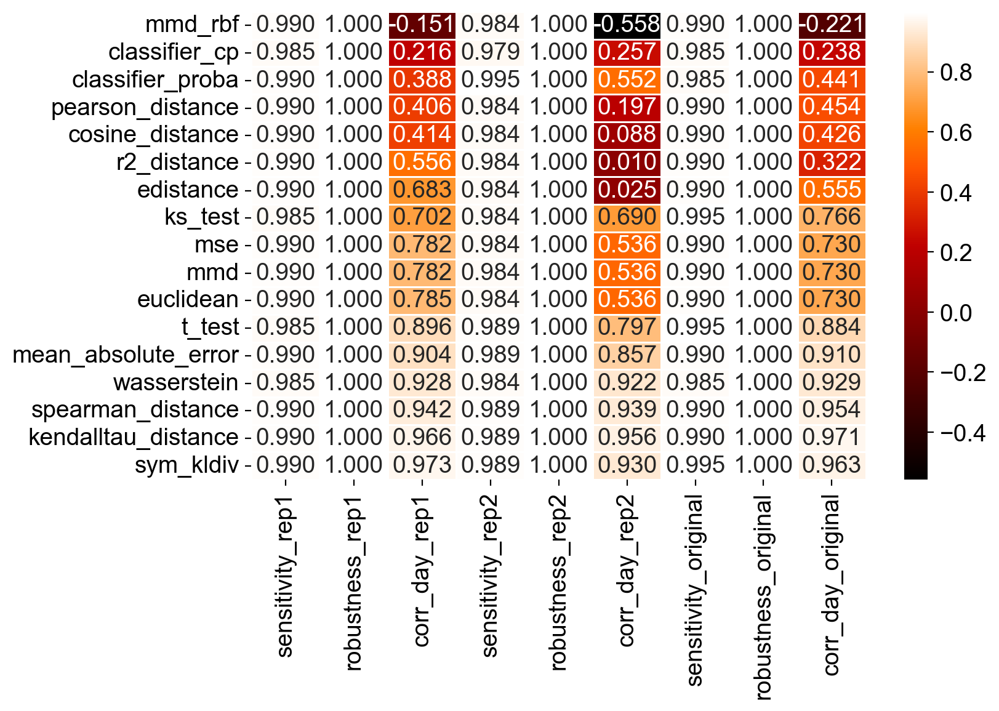

In [98]:
agg = pd.concat([performances['schiebinger_rep1'].add_suffix('_rep1'), performances['schiebinger_rep2'].add_suffix('_rep2'), performances['schiebinger_original'].add_suffix('_original')], axis=1).dropna()
plt.figure(figsize=(8, 5))
sns.heatmap(agg, annot=True, cmap='gist_heat', fmt=".3f", linewidths=.5)
plt.grid(False)

In [99]:
for key in ['rep1', 'rep2', 'original']:
    df = performances[f'schiebinger_{key}']
    ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
    ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
    print(key)
    print(ndf.mean(axis=1))

rep1
sym_kldiv              1.000000
kendalltau_distance    0.997146
spearman_distance      0.986273
mean_absolute_error    0.969285
euclidean              0.916689
mmd                    0.915330
mse                    0.915330
edistance              0.871161
r2_distance            0.814488
cosine_distance        0.751291
pearson_distance       0.747758
classifier_proba       0.739875
mmd_rbf                0.500000
wasserstein            0.480158
t_test                 0.465752
ks_test                0.379723
classifier_cp          0.163496
dtype: float64
rep2
classifier_proba       0.911258
kendalltau_distance    0.555556
spearman_distance      0.551876
sym_kldiv              0.549963
mean_absolute_error    0.533775
t_test                 0.520751
classifier_cp          0.512804
wasserstein            0.437013
ks_test                0.385946
mse                    0.352097
euclidean              0.352097
mmd                    0.352097
pearson_distance       0.277410
cosine_distance

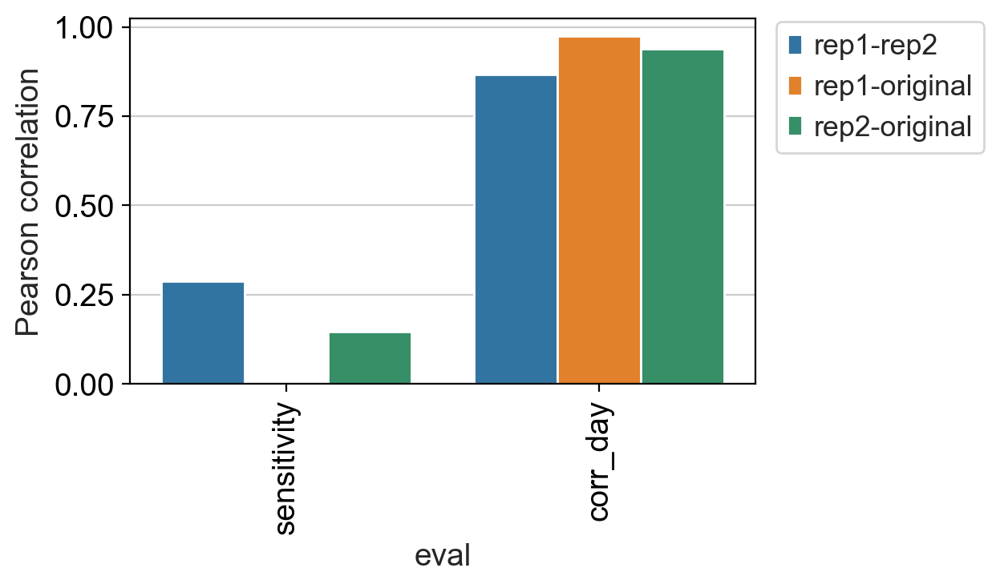

In [102]:
import itertools

aggs = []
for evalm in ['sensitivity', 'corr_day']:
    cols = [f'{evalm}_rep1', f'{evalm}_rep2', f'{evalm}_original']
    pairs = list(itertools.combinations(cols, 2))
    corrs = [agg[a].corr(agg[b], method='pearson') for a, b in pairs]

    plot_agg = pd.DataFrame({
        'pair': [f'{a}-{b}' for a, b in pairs],
        'correlation': corrs
    })
    plot_agg['eval'] = evalm
    aggs.append(plot_agg)
    
barplot_df = pd.concat(aggs).melt(id_vars=['eval', 'pair'])
barplot_df['pair_label'] = ['-'.join([x.split('-')[0].split('_')[-1], x.split('_')[-1]]) for x in barplot_df['pair']]

plt.figure(figsize=(5, 3))
sns.barplot(data=barplot_df, x='eval', y='value', hue='pair_label')
plt.ylabel('Pearson correlation')
plt.xticks(rotation=90)
plt_legend()
plt.savefig('./figures/batch_effect_schiebinger_corrbar.svg')
plt.show()

### sciplex

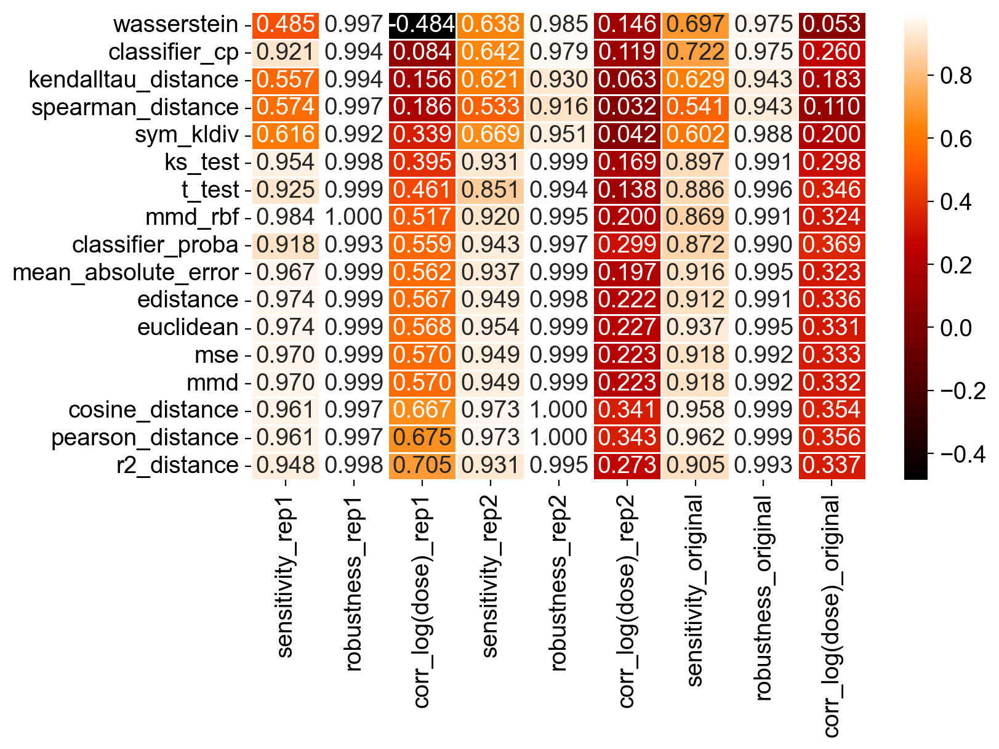

In [103]:
agg = pd.concat([performances['sciplex_rep1'].add_suffix('_rep1'), performances['sciplex_rep2'].add_suffix('_rep2'), performances['sciplex_original'].add_suffix('_original')], axis=1).dropna()
plt.figure(figsize=(8, 5))
sns.heatmap(agg, annot=True, cmap='gist_heat', fmt=".3f", linewidths=.5)
plt.grid(False)

In [109]:
agg.mean(axis=0).sort_index(ascending=False)

sensitivity_rep2           0.844930
sensitivity_rep1           0.862295
sensitivity_original       0.831821
robustness_rep2            0.984346
robustness_rep1            0.997066
robustness_original        0.985167
corr_log(dose)_rep2        0.191514
corr_log(dose)_rep1        0.417429
corr_log(dose)_original    0.284986
dtype: float64

In [77]:
for key in ['rep1', 'rep2', 'original']:
    df = performances[f'sciplex_{key}']
    ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
    ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
    print(key)
    print(ndf.mean(axis=1))

rep1
mmd_rbf                0.947419
edistance              0.945578
euclidean              0.928545
mmd                    0.928017
mse                    0.928017
mean_absolute_error    0.925762
r2_distance            0.886757
pearson_distance       0.868550
cosine_distance        0.866293
t_test                 0.848117
ks_test                0.827510
classifier_proba       0.620052
classifier_cp          0.562053
spearman_distance      0.487749
sym_kldiv              0.318534
kendalltau_distance    0.306346
wasserstein            0.202546
dtype: float64
rep2
pearson_distance       1.000000
cosine_distance        0.997670
classifier_proba       0.919530
r2_distance            0.876150
euclidean              0.858902
mmd                    0.849914
mse                    0.849914
edistance              0.846624
mean_absolute_error    0.811121
mmd_rbf                0.786802
ks_test                0.777612
t_test                 0.663727
wasserstein            0.474164
classifier_cp  

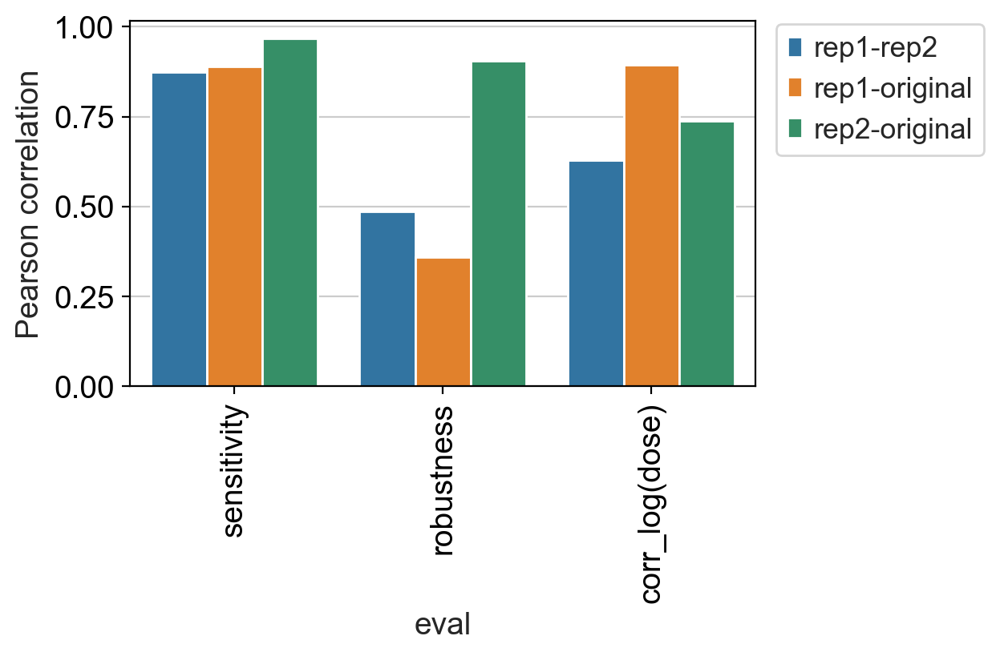

In [97]:
import itertools

aggs = []
for evalm in ['sensitivity', 'robustness', 'corr_log(dose)']:
    cols = [f'{evalm}_rep1', f'{evalm}_rep2', f'{evalm}_original']
    pairs = list(itertools.combinations(cols, 2))
    corrs = [agg[a].corr(agg[b], method='pearson') for a, b in pairs]

    plot_agg = pd.DataFrame({
        'pair': [f'{a}-{b}' for a, b in pairs],
        'correlation': corrs
    })
    plot_agg['eval'] = evalm
    aggs.append(plot_agg)
    
barplot_df = pd.concat(aggs).melt(id_vars=['eval', 'pair'])
barplot_df['pair_label'] = ['-'.join([x.split('-')[0].split('_')[-1], x.split('_')[-1]]) for x in barplot_df['pair']]

plt.figure(figsize=(5, 3))
sns.barplot(data=barplot_df, x='eval', y='value', hue='pair_label')
plt.ylabel('Pearson correlation')
plt.xticks(rotation=90)
plt_legend()
plt.savefig('./figures/batch_effect_sciplex_corrbar.svg')
plt.show()

In [10]:
agg.corr(method='spearman')

,sensitivity_rep1,robustness_rep1,corr_log(dose)_rep1,sensitivity_rep2,robustness_rep2,corr_log(dose)_rep2,sensitivity_original,robustness_original,corr_log(dose)_original
sensitivity_rep1,1.000000,0.833436,0.640050,0.712262,0.687154,0.534398,0.702703,0.556511,0.435851
robustness_rep1,0.833436,1.000000,0.397790,0.357144,0.393120,0.203806,0.444445,0.392879,0.166871
corr_log(dose)_rep1,0.640050,0.397790,1.000000,0.854158,0.795580,0.860123,0.855215,0.784049,0.778664
sensitivity_rep2,0.712262,0.357144,0.854158,1.000000,0.956899,0.883696,0.945235,0.780311,0.757693
robustness_rep2,0.687154,0.393120,0.795580,0.956899,1.000000,0.844690,0.965009,0.807858,0.647853
corr_log(dose)_rep2,0.534398,0.203806,0.860123,0.883696,0.844690,1.000000,0.833129,0.690798,0.822808
sensitivity_original,0.702703,0.444445,0.855215,0.945235,0.965009,0.833129,1.000000,0.869939,0.687922
robustness_original,0.556511,0.392879,0.784049,0.780311,0.807858,0.690798,0.869939,1.000000,0.712446
corr_log(dose)_original,0.435851,0.166871,0.778664,0.757693,0.647853,0.822808,0.687922,0.712446,1.000000


In [11]:
agg.corr(method='pearson')

,sensitivity_rep1,robustness_rep1,corr_log(dose)_rep1,sensitivity_rep2,robustness_rep2,corr_log(dose)_rep2,sensitivity_original,robustness_original,corr_log(dose)_original
sensitivity_rep1,1.000000,0.528400,0.791230,0.872831,0.808336,0.704649,0.890278,0.766026,0.937579
robustness_rep1,0.528400,1.000000,0.336070,0.524171,0.486178,0.309059,0.589044,0.358987,0.341464
corr_log(dose)_rep1,0.791230,0.336070,1.000000,0.802071,0.476024,0.628807,0.710330,0.608122,0.893708
sensitivity_rep2,0.872831,0.524171,0.802071,1.000000,0.871190,0.850762,0.967852,0.849497,0.893055
robustness_rep2,0.808336,0.486178,0.476024,0.871190,1.000000,0.793458,0.922939,0.904896,0.737951
corr_log(dose)_rep2,0.704649,0.309059,0.628807,0.850762,0.793458,1.000000,0.864438,0.715483,0.738240
sensitivity_original,0.890278,0.589044,0.710330,0.967852,0.922939,0.864438,1.000000,0.844434,0.869741
robustness_original,0.766026,0.358987,0.608122,0.849497,0.904896,0.715483,0.844434,1.000000,0.761900
corr_log(dose)_original,0.937579,0.341464,0.893708,0.893055,0.737951,0.738240,0.869741,0.761900,1.000000


In [18]:
def corr_plot(df, col1, col2, **kwargs):
    sns.scatterplot(data=df, x=col1, y=col2, **kwargs)
    corr = spearmanr(df[col1].values, df[col2].values)[0]
    plt.title(f'corr={corr:.3f}')
    plt.xscale('log')
    plt.yscale('log')
    plt_legend()

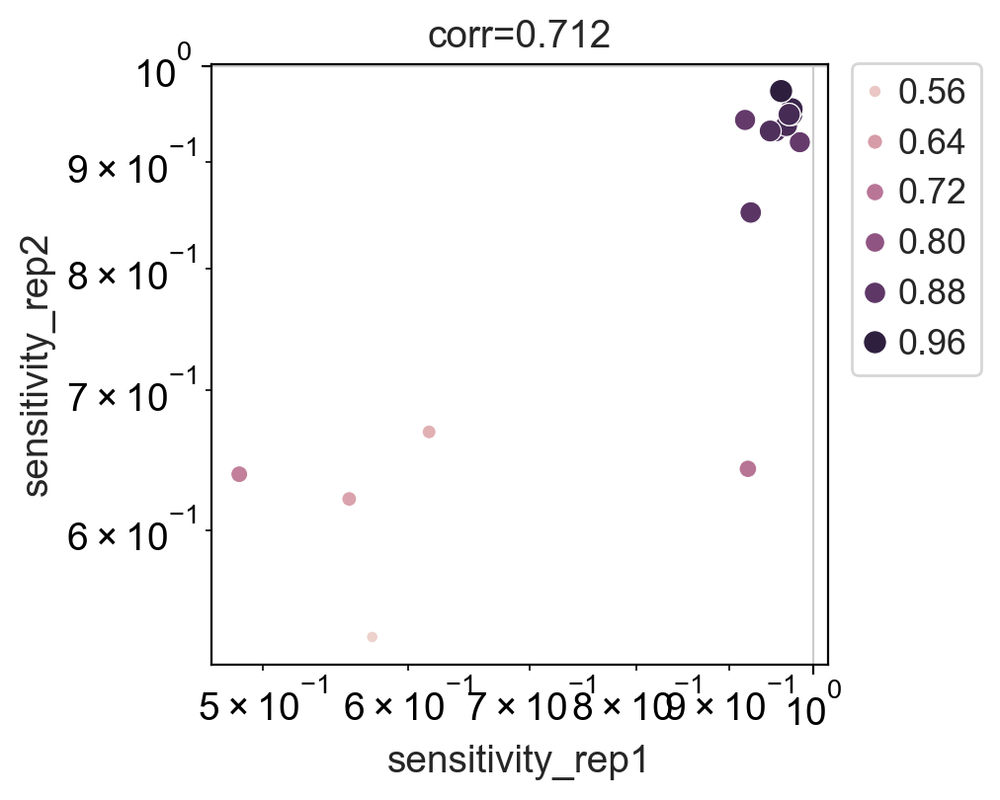

In [21]:
corr_plot(agg, 'sensitivity_rep1', 'sensitivity_rep2', hue='sensitivity_original', size='sensitivity_original')

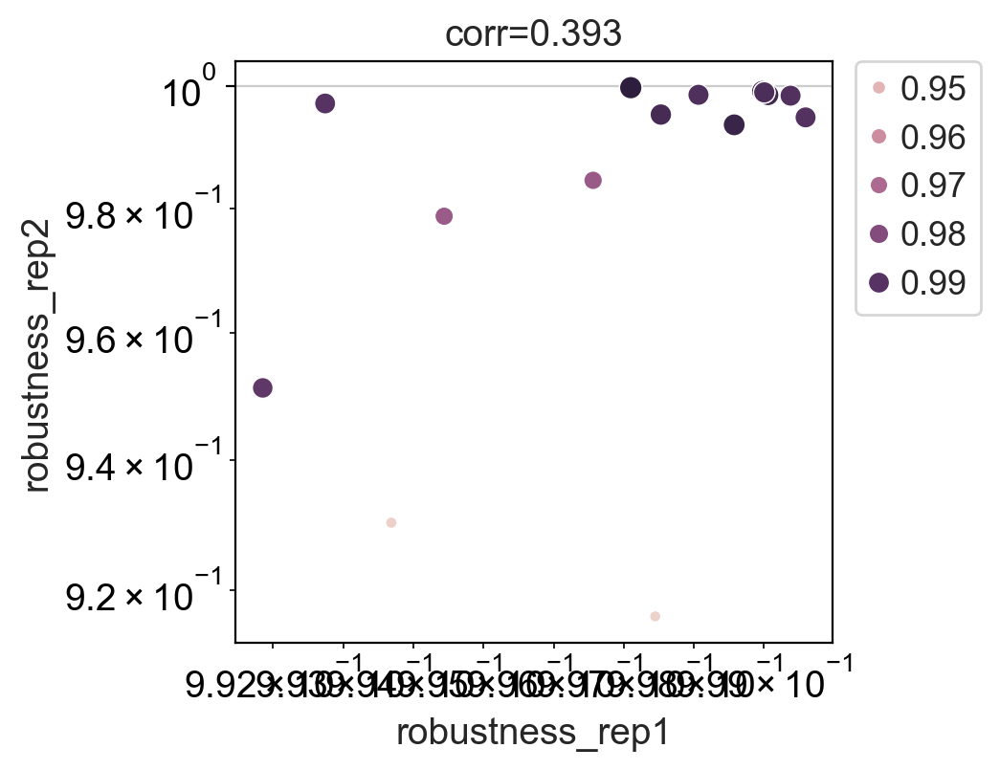

In [22]:
corr_plot(agg, 'robustness_rep1', 'robustness_rep2', hue='robustness_original', size='robustness_original')

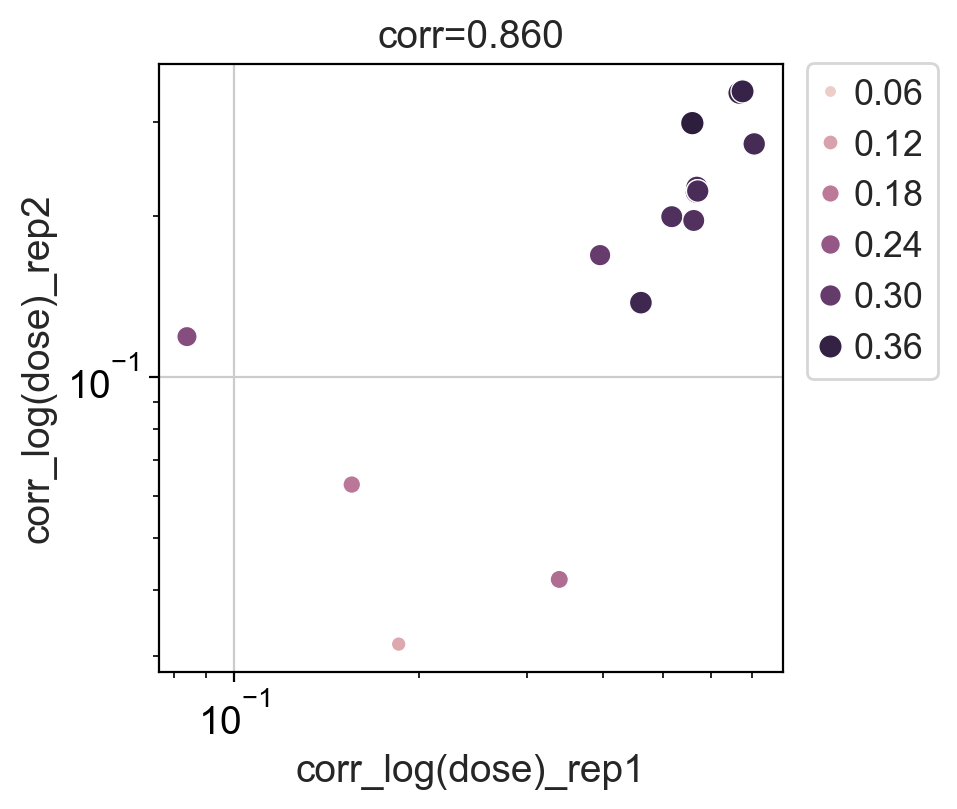

In [23]:
corr_plot(agg, 'corr_log(dose)_rep1', 'corr_log(dose)_rep2', hue='corr_log(dose)_original', size='corr_log(dose)_original')